Step#1: Load the background (darkframe) images and structure them channel wise.

The hierarchy created is as follows: main folder -> ROI folders (100) -> PMT files (1 or 2).

In [46]:
import os
import shutil
import re
from collections import defaultdict

# Original dataset folder
raw_scans = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/darkframe_endoscopic_scans'

# Parent folder (one level above darkframe_endoscopic_scans)
dataset_parent_folder = os.path.dirname(raw_scans)

# New structured folder inside the dataset parent
new_base_folder = os.path.join(dataset_parent_folder, 'structured_darkframes_endoscopic_scans')
os.makedirs(new_base_folder, exist_ok=True)

# List all TIFF files
files = [f for f in os.listdir(raw_scans) if f.endswith('.tiff')]

# Group files by the last 9-digit numeric code
grouped_files = defaultdict(list)

for file in files:
    # Extract the final 9 digits before -PMT
    match = re.search(r'-(\d{6})-(\d{3})-PMT[12]\.tiff$', file)
    if match:
        nine_digit_code = match.group(1) + match.group(2)
        grouped_files[nine_digit_code].append(file)

# Sort codes to maintain order
sorted_codes = sorted(grouped_files.keys())

# Process and copy files
for idx, code in enumerate(sorted_codes, start=1):
    roi_folder_name = f'ROI_{idx}'
    roi_folder_path = os.path.join(new_base_folder, roi_folder_name)
    os.makedirs(roi_folder_path, exist_ok=True)

    for file in grouped_files[code]:
        src_path = os.path.join(raw_scans, file)
        dst_path = os.path.join(roi_folder_path, file)
        shutil.copy2(src_path, dst_path)

print("Files copied and structured successfully into ROI folders!")



Files copied and structured successfully into ROI folders!


Check if the image sizes are consistent throughout.

In [47]:
# Check if all images have the same size
image_sizes = set()

# Traverse through each ROI folder
for roi_folder in sorted(os.listdir(structured_folder)):
    roi_path = os.path.join(structured_folder, roi_folder)
    if os.path.isdir(roi_path):
        for file in os.listdir(roi_path):
            if file.endswith('.tiff'):
                file_path = os.path.join(roi_path, file)
                img = np.array(Image.open(file_path))
                image_sizes.add(img.shape)

# Output the result
if len(image_sizes) == 1:
    print(f"All images have consistent size: {image_sizes.pop()}")
else:
    print(f"Inconsistent image sizes found: {image_sizes}")

All images have consistent size: (385, 385)


Step#2: Create a Bias Filter for Both Channels

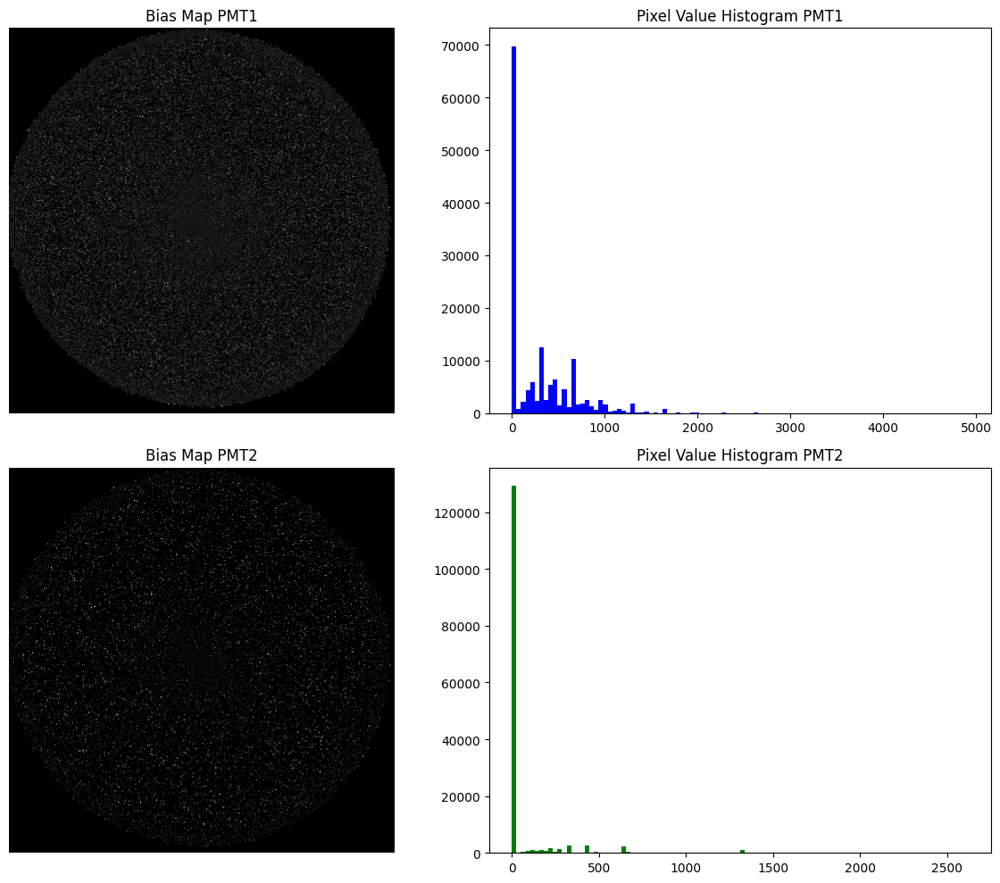

Bias maps created and saved successfully!


In [82]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Folder where your structured data is (ROI_1, ROI_2, etc.)
structured_folder = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/structured_darkframes_endoscopic_scans'

# Initialize lists to hold images
pmt1_images = []
pmt2_images = []

# Traverse through each ROI folder
for roi_folder in sorted(os.listdir(structured_folder)):
    roi_path = os.path.join(structured_folder, roi_folder)
    if os.path.isdir(roi_path):
        for file in os.listdir(roi_path):
            if file.endswith('.tiff'):
                file_path = os.path.join(roi_path, file)
                img = np.array(Image.open(file_path)).astype(np.float32)

                if 'PMT1' in file:
                    pmt1_images.append(img)
                elif 'PMT2' in file:
                    pmt2_images.append(img)

# Stack across channels and compute pixel-wise average
pmt1_stack = np.stack(pmt1_images, axis=0)
pmt2_stack = np.stack(pmt2_images, axis=0)

bias_map_pmt1 = np.mean(pmt1_stack, axis=0)
bias_map_pmt2 = np.mean(pmt2_stack, axis=0)

# Save the bias maps
bias_maps_folder = os.path.join('/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset', 'bias_maps')
os.makedirs(bias_maps_folder, exist_ok=True)

Image.fromarray(bias_map_pmt1.astype(np.uint16)).save(os.path.join(bias_maps_folder, 'bias_map_PMT1.tiff'))
Image.fromarray(bias_map_pmt2.astype(np.uint16)).save(os.path.join(bias_maps_folder, 'bias_map_PMT2.tiff'))

# Plot bias maps and their histograms
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# PMT1 Bias Map
axs[0, 0].imshow(bias_map_pmt1, cmap='gray')
axs[0, 0].set_title('Bias Map PMT1')
axs[0, 0].axis('off')

# PMT1 Histogram
axs[0, 1].hist(bias_map_pmt1.flatten(), bins=100, color='blue')
axs[0, 1].set_title('Pixel Value Histogram PMT1')

# PMT2 Bias Map
axs[1, 0].imshow(bias_map_pmt2, cmap='gray')
axs[1, 0].set_title('Bias Map PMT2')
axs[1, 0].axis('off')

# PMT2 Histogram
axs[1, 1].hist(bias_map_pmt2.flatten(), bins=100, color='green')
axs[1, 1].set_title('Pixel Value Histogram PMT2')

plt.tight_layout()
plt.show()

print("Bias maps created and saved successfully!")


Normalised Bias Maps

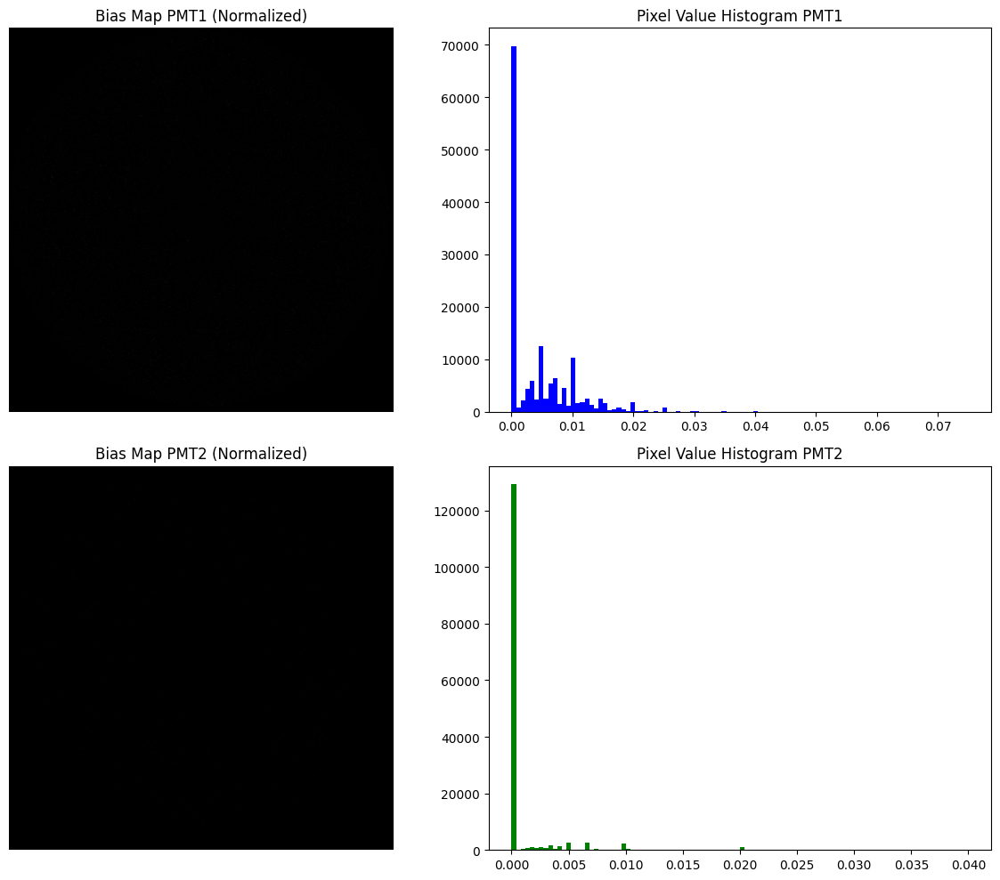

Bias maps created, normalized, and saved successfully as float32 TIFFs!


In [95]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tifffile  # Important: tifffile handles float32 TIFFs properly!

# Paths
structured_folder = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/structured_darkframes_endoscopic_scans'
bias_maps_folder = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/bias_maps'

# Initialize lists to hold normalized images
pmt1_images = []
pmt2_images = []

# Traverse through each ROI folder
for roi_folder in sorted(os.listdir(structured_folder)):
    roi_path = os.path.join(structured_folder, roi_folder)
    if os.path.isdir(roi_path):
        for file in os.listdir(roi_path):
            if file.endswith('.tiff'):
                file_path = os.path.join(roi_path, file)
                img = np.array(tifffile.imread(file_path)).astype(np.float32)

                # Min-Max normalize the image to [0, 1]
                img_min = np.min(img)
                img_max = np.max(img)
                if img_max > img_min:
                    img_normalized = (img - img_min) / (img_max - img_min)
                else:
                    img_normalized = np.zeros_like(img)  # Handle flat image edge case

                if 'PMT1' in file:
                    pmt1_images.append(img_normalized)
                elif 'PMT2' in file:
                    pmt2_images.append(img_normalized)

# Stack across channels and compute pixel-wise average (bias map)
pmt1_stack = np.stack(pmt1_images, axis=0)
pmt2_stack = np.stack(pmt2_images, axis=0)

bias_map_pmt1 = np.mean(pmt1_stack, axis=0)
bias_map_pmt2 = np.mean(pmt2_stack, axis=0)

# Save the bias maps as float32 TIFFs
os.makedirs(bias_maps_folder, exist_ok=True)
tifffile.imwrite(os.path.join(bias_maps_folder, 'bias_map_PMT1.tiff'), bias_map_pmt1.astype(np.float32))
tifffile.imwrite(os.path.join(bias_maps_folder, 'bias_map_PMT2.tiff'), bias_map_pmt2.astype(np.float32))

# Plot bias maps and their histograms
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# PMT1 Bias Map
axs[0, 0].imshow(bias_map_pmt1, cmap='gray', vmin=0, vmax=1)
axs[0, 0].set_title('Bias Map PMT1 (Normalized)')
axs[0, 0].axis('off')

# PMT1 Histogram
axs[0, 1].hist(bias_map_pmt1.flatten(), bins=100, color='blue')
axs[0, 1].set_title('Pixel Value Histogram PMT1')

# PMT2 Bias Map
axs[1, 0].imshow(bias_map_pmt2, cmap='gray', vmin=0, vmax=1)
axs[1, 0].set_title('Bias Map PMT2 (Normalized)')
axs[1, 0].axis('off')

# PMT2 Histogram
axs[1, 1].hist(bias_map_pmt2.flatten(), bins=100, color='green')
axs[1, 1].set_title('Pixel Value Histogram PMT2')

plt.tight_layout()
plt.show()

print("Bias maps created, normalized, and saved successfully as float32 TIFFs!")


In [53]:
# calculate average value of each bias map
def calculate_average_bias_map(bias_map):
    return np.mean(bias_map)
print(f"Average value of PMT1 bias map: {calculate_average_bias_map(bias_map_pmt1)}")
print(f"Average value of PMT2 bias map: {calculate_average_bias_map(bias_map_pmt2)}")

Average value of PMT1 bias map: 295.1939697265625
Average value of PMT2 bias map: 51.947059631347656


In [91]:
# calculate average value of each normalized bias map
def calculate_average_bias_map(bias_map):
    return np.mean(bias_map)
print(f"Average value of PMT1 bias map: {calculate_average_bias_map(bias_map_pmt1)}")
print(f"Average value of PMT2 bias map: {calculate_average_bias_map(bias_map_pmt2)}")

Average value of PMT1 bias map: 0.0045043714344501495
Average value of PMT2 bias map: 0.000792661274317652


In [88]:
# calculate count of pixels above 0 for each bias map
def count_pixels_above_threshold(bias_map, threshold=0):
    return np.sum(bias_map > threshold)
print(f"Count of pixels above 0 in PMT1 bias map: {count_pixels_above_threshold(bias_map_pmt1)}")
print(f"Count of pixels above 0 in PMT2 bias map: {count_pixels_above_threshold(bias_map_pmt2)}")

Count of pixels above 0 in PMT1 bias map: 78537
Count of pixels above 0 in PMT2 bias map: 19083


Step#3: Subtract Bias Maps from Images to Model Actual Noise 

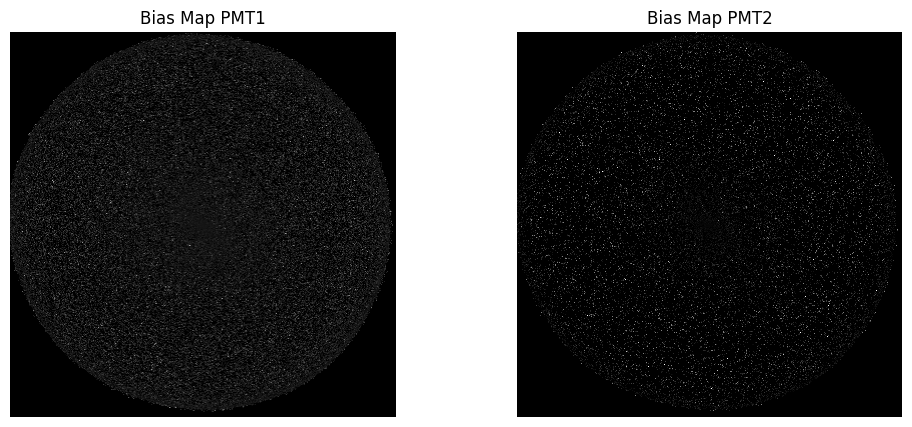

In [92]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Paths
raw_scans = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/float32_endoscopic_scans/ROI_1'
bias_maps_folder = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/bias_maps'

# Load the bias maps
bias_map_pmt1 = np.array(Image.open(os.path.join(bias_maps_folder, 'bias_map_PMT1.tiff'))).astype(np.float32)
bias_map_pmt2 = np.array(Image.open(os.path.join(bias_maps_folder, 'bias_map_PMT2.tiff'))).astype(np.float32)

# show the bias maps
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(bias_map_pmt1, cmap='gray')
plt.title('Bias Map PMT1')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(bias_map_pmt2, cmap='gray')
plt.title('Bias Map PMT2')
plt.axis('off')
plt.show()

Files in the folder: ['PMT1.tiff', 'PMT2.tiff']
Number of .tiff files: 2


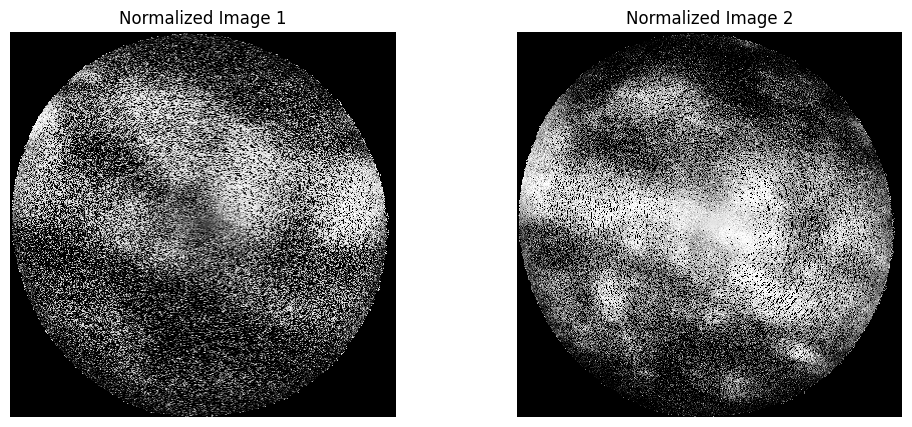

In [96]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

raw_scans = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/float32_endoscopic_scans/ROI_1/Image-20250326-231205-592'
# Get .tiff files
files = [f for f in os.listdir(raw_scans) if f.lower().endswith('.tiff')]
files.sort()

# Check and debug the files
print(f"Files in the folder: {files}")
print(f"Number of .tiff files: {len(files)}")

# Check if there are at least two files
if len(files) < 2:
    print("Error: Not enough .tiff files in the dataset folder to display.")
else:
    file1 = os.path.join(raw_scans, files[0])
    file2 = os.path.join(raw_scans, files[1])
    img1 = np.array(Image.open(file1)).astype(np.float32)
    img2 = np.array(Image.open(file2)).astype(np.float32)

    # Normalize images to [0, 1]
    def normalize(img):
        img_min = np.min(img)
        img_max = np.max(img)
        if img_max > img_min:
            return (img - img_min) / (img_max - img_min)
        else:
            return np.zeros_like(img)  # Handle flat image

    img1_norm = normalize(img1)
    img2_norm = normalize(img2)
    
    # Display the normalized images
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img1_norm, cmap='gray', vmin=0, vmax=1)
    plt.title('Normalized Image 1')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(img2_norm, cmap='gray', vmin=0, vmax=1)
    plt.title('Normalized Image 2')
    plt.axis('off')
    
    plt.show()



Files in the folder: ['PMT1.tiff', 'PMT2.tiff']
Number of .tiff files: 2


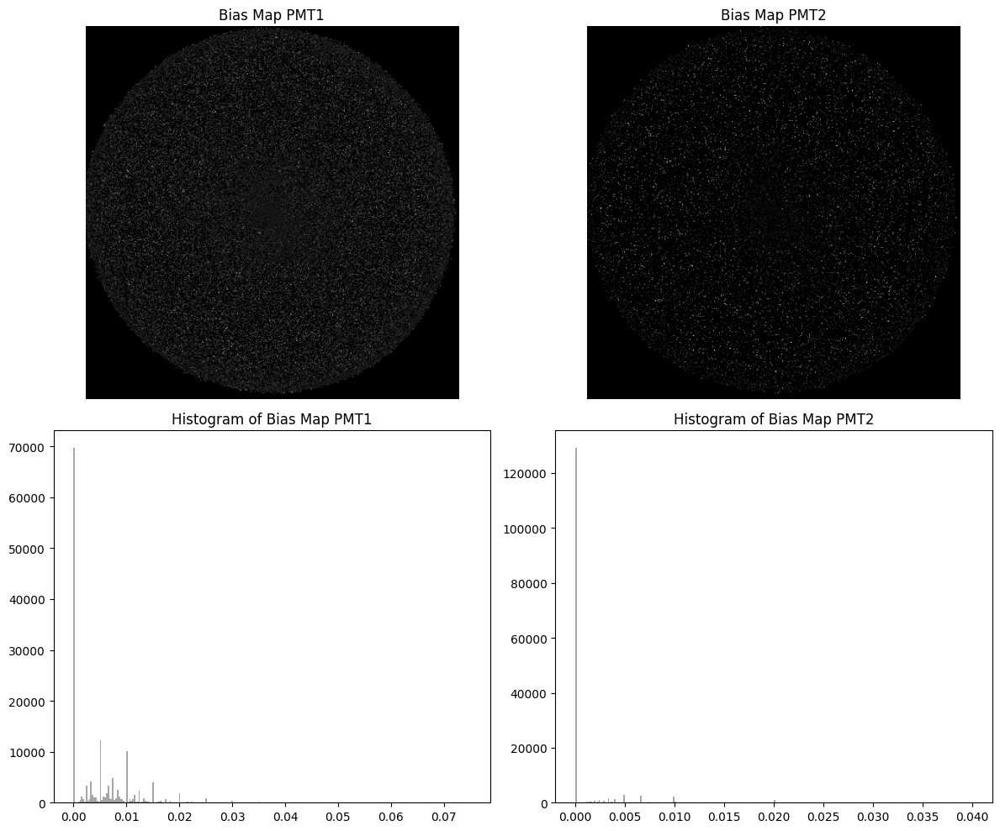

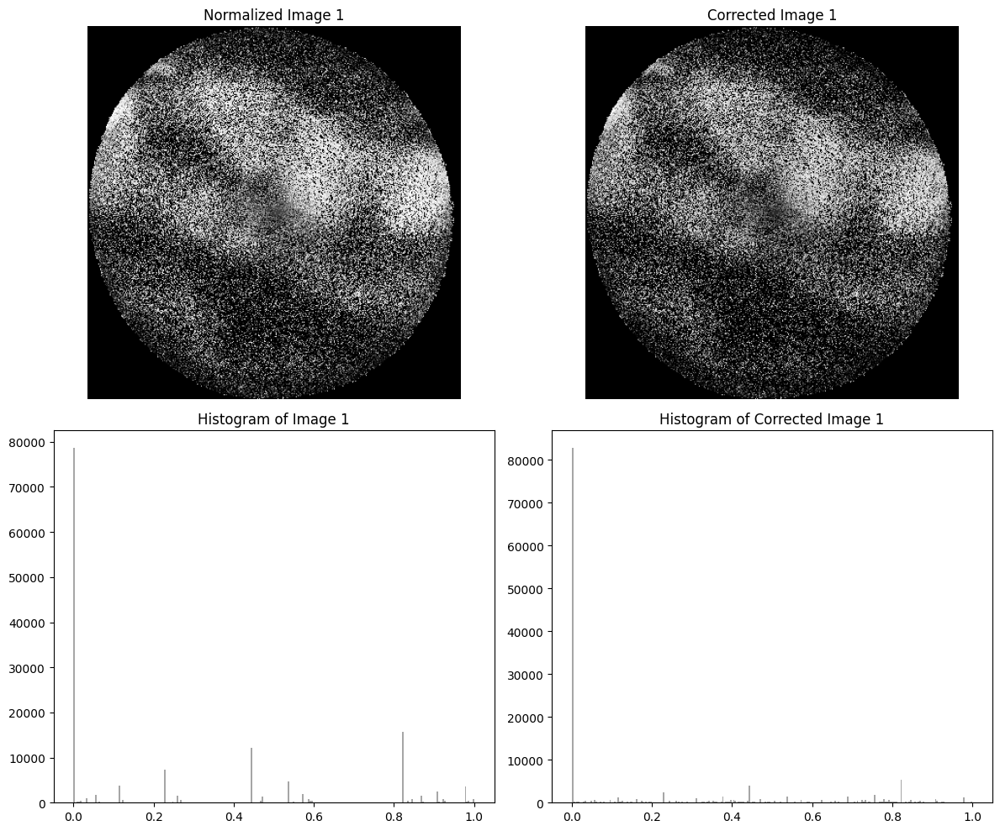

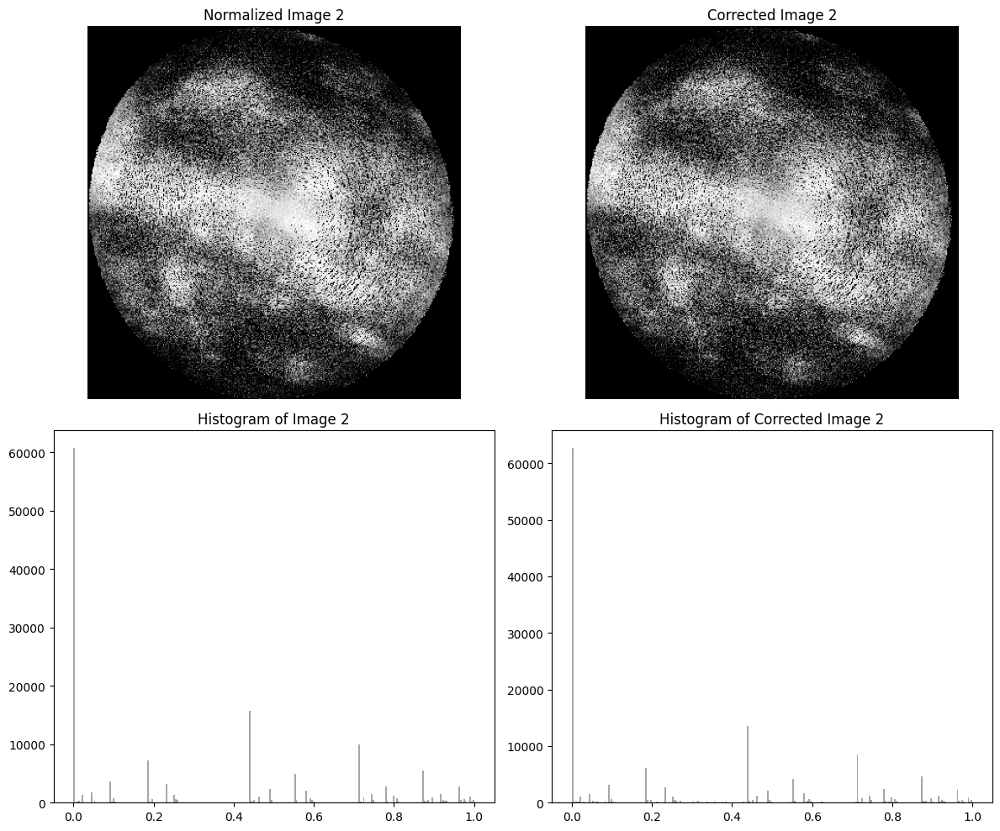

In [99]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Paths
raw_scans = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/float32_endoscopic_scans/ROI_1/Image-20250326-231205-592'
bias_maps_folder = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/bias_maps'

# Load the bias maps
bias_map_pmt1 = np.array(Image.open(os.path.join(bias_maps_folder, 'bias_map_PMT1.tiff'))).astype(np.float32)
bias_map_pmt2 = np.array(Image.open(os.path.join(bias_maps_folder, 'bias_map_PMT2.tiff'))).astype(np.float32)

# Function to normalize an image to [0, 1]
def normalize(img):
    img_min = np.min(img)
    img_max = np.max(img)
    if img_max > img_min:
        return (img - img_min) / (img_max - img_min)
    else:
        return np.zeros_like(img)  # Handle flat image edge case

# Get .tiff files
files = [f for f in os.listdir(raw_scans) if f.lower().endswith('.tiff')]
files.sort()

# Check and debug the files
print(f"Files in the folder: {files}")
print(f"Number of .tiff files: {len(files)}")

# Check if there are at least two files
if len(files) < 2:
    print("Error: Not enough .tiff files in the dataset folder to display.")
else:
    # Load and normalize the first two images
    file1 = os.path.join(raw_scans, files[0])
    file2 = os.path.join(raw_scans, files[1])
    img1 = np.array(Image.open(file1)).astype(np.float32)
    img2 = np.array(Image.open(file2)).astype(np.float32)

    # Normalize images
    img1_norm = normalize(img1)
    img2_norm = normalize(img2)
    
    # Normalize the bias maps to the [0, 1] range
    def normalize_bias_map(bias_map):
        bias_map_min = np.min(bias_map)
        bias_map_max = np.max(bias_map)
        if bias_map_max > bias_map_min:
            return (bias_map - bias_map_min) / (bias_map_max - bias_map_min)
        else:
            return np.zeros_like(bias_map)  # Handle flat bias map case

    # Normalize bias maps to the same scale as the image
    bias_map_pmt1_normalized = normalize_bias_map(bias_map_pmt1)
    bias_map_pmt2_normalized = normalize_bias_map(bias_map_pmt2)

    # Now subtract the normalized bias maps
    corrected_img1 = img1_norm - bias_map_pmt1_normalized
    corrected_img2 = img2_norm - bias_map_pmt2_normalized

    # Clip negative values after subtraction
    corrected_img1 = np.clip(corrected_img1, 0, None)
    corrected_img2 = np.clip(corrected_img2, 0, None)
    # Plot the bias maps and their histograms
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    # Bias Map PMT1 and Histogram
    axs[0, 0].imshow(bias_map_pmt1, cmap='gray')
    axs[0, 0].set_title('Bias Map PMT1')
    axs[0, 0].axis('off')
    axs[1, 0].hist(bias_map_pmt1.ravel(), bins=256, color='gray', alpha=0.7)
    axs[1, 0].set_title('Histogram of Bias Map PMT1')

    # Bias Map PMT2 and Histogram
    axs[0, 1].imshow(bias_map_pmt2, cmap='gray')
    axs[0, 1].set_title('Bias Map PMT2')
    axs[0, 1].axis('off')
    axs[1, 1].hist(bias_map_pmt2.ravel(), bins=256, color='gray', alpha=0.7)
    axs[1, 1].set_title('Histogram of Bias Map PMT2')

    plt.tight_layout()
    plt.show()

    # Plot the original, corrected images, and their histograms for Image 1
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    # Original Image 1 and Histogram
    axs[0, 0].imshow(img1_norm, cmap='gray', vmin=0, vmax=1)
    axs[0, 0].set_title('Normalized Image 1')
    axs[0, 0].axis('off')
    axs[1, 0].hist(img1_norm.ravel(), bins=256, color='gray', alpha=0.7)
    axs[1, 0].set_title('Histogram of Image 1')

    # Corrected Image 1 and Histogram
    axs[0, 1].imshow(corrected_img1, cmap='gray', vmin=0, vmax=1)
    axs[0, 1].set_title('Corrected Image 1')
    axs[0, 1].axis('off')
    axs[1, 1].hist(corrected_img1.ravel(), bins=256, color='gray', alpha=0.7)
    axs[1, 1].set_title('Histogram of Corrected Image 1')

    plt.tight_layout()
    plt.show()

    # Plot for Image 2
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    # Original Image 2 and Histogram
    axs[0, 0].imshow(img2_norm, cmap='gray', vmin=0, vmax=1)
    axs[0, 0].set_title('Normalized Image 2')
    axs[0, 0].axis('off')
    axs[1, 0].hist(img2_norm.ravel(), bins=256, color='gray', alpha=0.7)
    axs[1, 0].set_title('Histogram of Image 2')

    # Corrected Image 2 and Histogram
    axs[0, 1].imshow(corrected_img2, cmap='gray', vmin=0, vmax=1)
    axs[0, 1].set_title('Corrected Image 2')
    axs[0, 1].axis('off')
    axs[1, 1].hist(corrected_img2.ravel(), bins=256, color='gray', alpha=0.7)
    axs[1, 1].set_title('Histogram of Corrected Image 2')

    plt.tight_layout()
    plt.show()


In [ ]:
# Subtract darkframe bias maps from the images & save them in a folder called corrected_endoscopic_scans

Step#4: Model the Kind of Noise

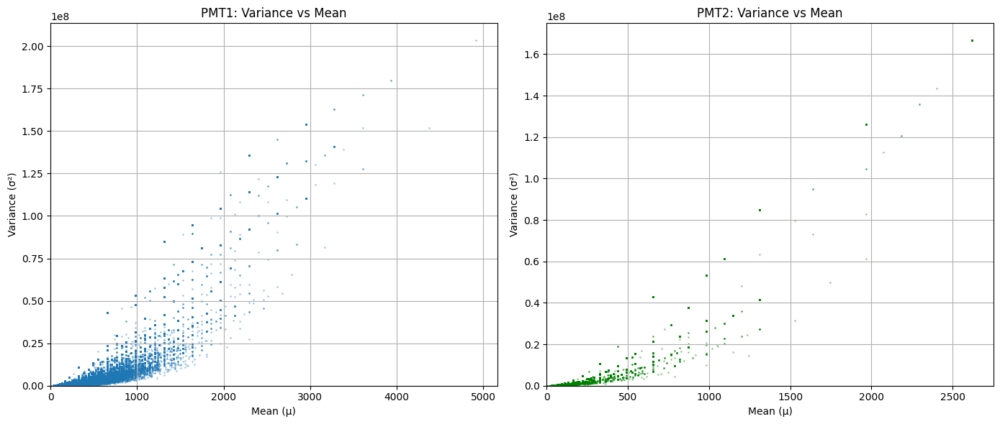

Noise analysis complete!


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

structured_folder = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/structured_darkframes_endoscopic_scans'

# Initialize lists to hold images
pmt1_images = []
pmt2_images = []

# Traverse through each ROI folder
for roi_folder in sorted(os.listdir(structured_folder)):
    roi_path = os.path.join(structured_folder, roi_folder)
    if os.path.isdir(roi_path):
        for file in os.listdir(roi_path):
            if file.endswith('.tiff'):
                file_path = os.path.join(roi_path, file)
                img = np.array(Image.open(file_path)).astype(np.float32)

                if 'PMT1' in file:
                    pmt1_images.append(img)
                elif 'PMT2' in file:
                    pmt2_images.append(img)

# Stack across channels
pmt1_stack = np.stack(pmt1_images, axis=0)  # Shape: (N, H, W)
pmt2_stack = np.stack(pmt2_images, axis=0)

# Compute per-pixel mean and variance 
# PMT1
mean_pmt1 = np.mean(pmt1_stack, axis=0)  # (H, W)
var_pmt1 = np.var(pmt1_stack, axis=0, ddof=1)  # (H, W) with unbiased estimator

# PMT2
mean_pmt2 = np.mean(pmt2_stack, axis=0)
var_pmt2 = np.var(pmt2_stack, axis=0, ddof=1)

# Flatten for scatter plot
mean_pmt1_flat = mean_pmt1.flatten()
var_pmt1_flat = var_pmt1.flatten()

mean_pmt2_flat = mean_pmt2.flatten()
var_pmt2_flat = var_pmt2.flatten()

# Scatter Plot σ² vs μ 
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# PMT1
axs[0].scatter(mean_pmt1_flat, var_pmt1_flat, s=1, alpha=0.3)
axs[0].set_xlabel('Mean (μ)')
axs[0].set_ylabel('Variance (σ²)')
axs[0].set_title('PMT1: Variance vs Mean')
axs[0].grid(True)
axs[0].set_xlim(left=0)
axs[0].set_ylim(bottom=0)

# PMT2
axs[1].scatter(mean_pmt2_flat, var_pmt2_flat, s=1, alpha=0.3, color='green')
axs[1].set_xlabel('Mean (μ)')
axs[1].set_ylabel('Variance (σ²)')
axs[1].set_title('PMT2: Variance vs Mean')
axs[1].grid(True)
axs[1].set_xlim(left=0)
axs[1].set_ylim(bottom=0)

plt.tight_layout()
plt.show()

print("Noise analysis complete!")


Fit a line through the points.

Now, compare if fitting a line or fitting a curve is better.


Noise model for PMT1:
Linear model: σ² ≈ αμ + β
  α = 34794.5352
  β = -8550452.0000
  RMSE = 8961776.0000
  Variance positive across range? No

Quadratic model: σ² ≈ aμ² + bμ + c
  a = 11.809250
  b = 13988.3028
  c = -2113533.2293
  RMSE = 8355440.4446
  Variance positive across range? No

Noise model for PMT2:
Linear model: σ² ≈ αμ + β
  α = 59755.8320
  β = -11879061.0000
  RMSE = 7837013.5000
  Variance positive across range? No

Quadratic model: σ² ≈ aμ² + bμ + c
  a = 25.144964
  b = 24264.1375
  c = -4179270.9159
  RMSE = 6380435.4588
  Variance positive across range? No


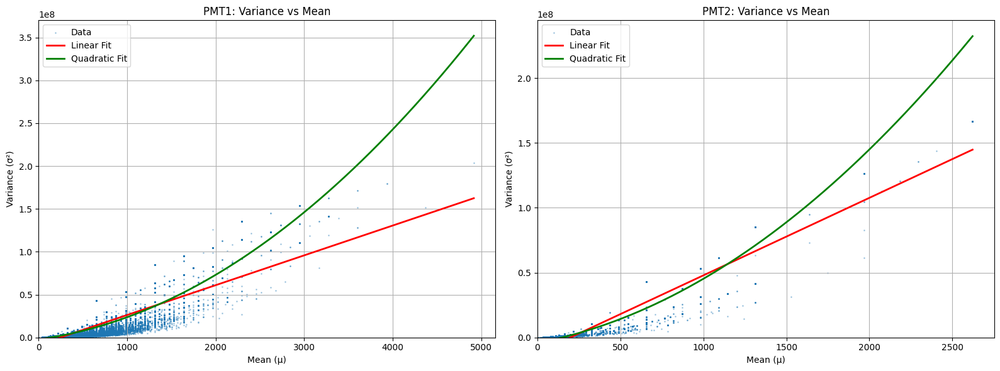


Noise analysis and fitting complete!


In [76]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Folder where your structured data is
structured_folder = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/structured_darkframes_endoscopic_scans'

# Initialize lists to hold images
pmt1_images = []
pmt2_images = []

# Traverse through each ROI folder
for roi_folder in sorted(os.listdir(structured_folder)):
    roi_path = os.path.join(structured_folder, roi_folder)
    if os.path.isdir(roi_path):
        for file in os.listdir(roi_path):
            if file.endswith('.tiff'):
                file_path = os.path.join(roi_path, file)
                img = np.array(Image.open(file_path)).astype(np.float32)

                if 'PMT1' in file:
                    pmt1_images.append(img)
                elif 'PMT2' in file:
                    pmt2_images.append(img)

# Stack across channels
pmt1_stack = np.stack(pmt1_images, axis=0)
pmt2_stack = np.stack(pmt2_images, axis=0)

# Compute per-pixel mean and variance
mean_pmt1 = np.mean(pmt1_stack, axis=0)
var_pmt1 = np.var(pmt1_stack, axis=0, ddof=1)

mean_pmt2 = np.mean(pmt2_stack, axis=0)
var_pmt2 = np.var(pmt2_stack, axis=0, ddof=1)

# Flatten for scatter plot
mean_pmt1_flat = mean_pmt1.flatten()
var_pmt1_flat = var_pmt1.flatten()

mean_pmt2_flat = mean_pmt2.flatten()
var_pmt2_flat = var_pmt2.flatten()

# ======= NEW: Analysis: Fit both linear and quadratic noise models =======
def fit_noise_models(mean_values, var_values, channel_name):
    # Remove zeros and NaNs
    valid = (mean_values > 0) & (var_values > 0)
    mean_valid = mean_values[valid]
    var_valid = var_values[valid]

    # Linear model
    mean_valid_lin = mean_valid.reshape(-1, 1)
    lin_reg = LinearRegression().fit(mean_valid_lin, var_valid)
    var_pred_lin = lin_reg.predict(mean_valid_lin)
    rmse_lin = np.sqrt(mean_squared_error(var_valid, var_pred_lin))

    # Quadratic model (polyfit degree=2)
    quad_coefs = np.polyfit(mean_valid, var_valid, 2)
    var_pred_quad = np.polyval(quad_coefs, mean_valid)
    rmse_quad = np.sqrt(mean_squared_error(var_valid, var_pred_quad))

    # Physical reasonableness check (variance must be positive)
    mean_check = np.linspace(0, np.max(mean_valid), 500)
    var_lin_check = lin_reg.predict(mean_check.reshape(-1, 1))
    var_quad_check = np.polyval(quad_coefs, mean_check)

    lin_positive = np.all(var_lin_check >= 0)
    quad_positive = np.all(var_quad_check >= 0)

    # Report
    print(f"\nNoise model for {channel_name}:")
    print("Linear model: σ² ≈ αμ + β")
    print(f"  α = {lin_reg.coef_[0]:.4f}")
    print(f"  β = {lin_reg.intercept_:.4f}")
    print(f"  RMSE = {rmse_lin:.4f}")
    print(f"  Variance positive across range? {'Yes' if lin_positive else 'No'}")

    print("\nQuadratic model: σ² ≈ aμ² + bμ + c")
    print(f"  a = {quad_coefs[0]:.6f}")
    print(f"  b = {quad_coefs[1]:.4f}")
    print(f"  c = {quad_coefs[2]:.4f}")
    print(f"  RMSE = {rmse_quad:.4f}")
    print(f"  Variance positive across range? {'Yes' if quad_positive else 'No'}")

    return lin_reg, quad_coefs

# Fit models
lin_pmt1, quad_pmt1 = fit_noise_models(mean_pmt1_flat, var_pmt1_flat, "PMT1")
lin_pmt2, quad_pmt2 = fit_noise_models(mean_pmt2_flat, var_pmt2_flat, "PMT2")

# ======= Plotting: Show scatter, linear and quadratic fits =======
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

def plot_models(ax, mean_flat, var_flat, lin_reg, quad_coefs, channel_name):
    ax.scatter(mean_flat, var_flat, s=1, alpha=0.3, label='Data')

    mean_range = np.linspace(0, np.max(mean_flat), 1000)
    var_lin = lin_reg.predict(mean_range.reshape(-1, 1))
    var_quad = np.polyval(quad_coefs, mean_range)

    ax.plot(mean_range, var_lin, color='red', linewidth=2, label='Linear Fit')
    ax.plot(mean_range, var_quad, color='green', linewidth=2, label='Quadratic Fit')
    ax.set_xlabel('Mean (μ)')
    ax.set_ylabel('Variance (σ²)')
    ax.set_title(f'{channel_name}: Variance vs Mean')
    ax.legend()
    ax.grid(True)
    ax.set_xlim(left=0)
    ax.set_ylim(bottom=0)

# PMT1
plot_models(axs[0], mean_pmt1_flat, var_pmt1_flat, lin_pmt1, quad_pmt1, "PMT1")

# PMT2
plot_models(axs[1], mean_pmt2_flat, var_pmt2_flat, lin_pmt2, quad_pmt2, "PMT2")

plt.tight_layout()
plt.show()

print("\nNoise analysis and fitting complete!")



Noise model for PMT1:
Linear model: σ² ≈ αμ + β
  α = 0.5309
  β = -0.0020
  RMSE = 0.0021
  Variance positive across range? No

Quadratic model: σ² ≈ aμ² + bμ + c
  a = 11.809252
  b = 0.2134
  c = -0.0005
  RMSE = 0.0019
  Variance positive across range? No

Noise model for PMT2:
Linear model: σ² ≈ αμ + β
  α = 0.9118
  β = -0.0028
  RMSE = 0.0018
  Variance positive across range? No

Quadratic model: σ² ≈ aμ² + bμ + c
  a = 25.144962
  b = 0.3702
  c = -0.0010
  RMSE = 0.0015
  Variance positive across range? No


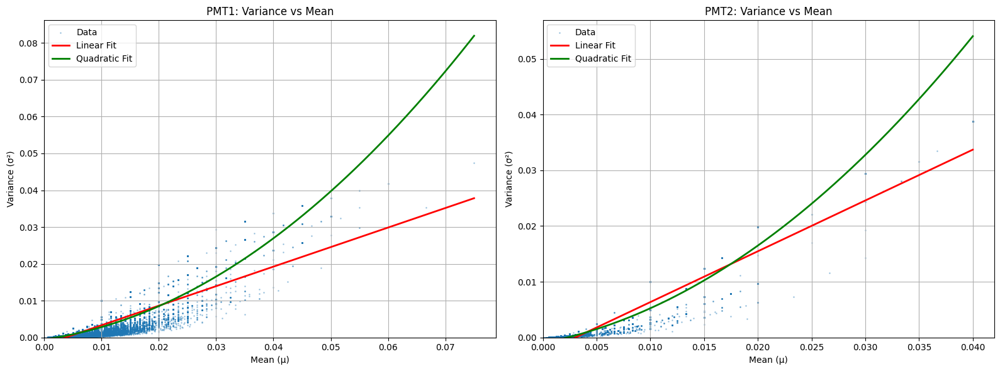


Noise analysis and fitting complete!


In [103]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Folder where your structured data is
structured_folder = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/structured_darkframes_endoscopic_scans'

# Initialize lists to hold normalized images
pmt1_images = []
pmt2_images = []

# Function to normalize images min-max
def normalize_image(img):
    img_min = np.min(img)
    img_max = np.max(img)
    if img_max > img_min:
        return (img - img_min) / (img_max - img_min)
    else:
        return np.zeros_like(img)  # Handle flat image edge case

# Traverse through each ROI folder
for roi_folder in sorted(os.listdir(structured_folder)):
    roi_path = os.path.join(structured_folder, roi_folder)
    if os.path.isdir(roi_path):
        for file in os.listdir(roi_path):
            if file.endswith('.tiff'):
                file_path = os.path.join(roi_path, file)
                img = np.array(Image.open(file_path)).astype(np.float32)

                # Normalize the image before adding it to the list
                img_normalized = normalize_image(img)

                if 'PMT1' in file:
                    pmt1_images.append(img_normalized)
                elif 'PMT2' in file:
                    pmt2_images.append(img_normalized)

# Stack across channels
pmt1_stack = np.stack(pmt1_images, axis=0)
pmt2_stack = np.stack(pmt2_images, axis=0)

# Compute per-pixel mean and variance
mean_pmt1 = np.mean(pmt1_stack, axis=0)
var_pmt1 = np.var(pmt1_stack, axis=0, ddof=1)

mean_pmt2 = np.mean(pmt2_stack, axis=0)
var_pmt2 = np.var(pmt2_stack, axis=0, ddof=1)

# Flatten for scatter plot
mean_pmt1_flat = mean_pmt1.flatten()
var_pmt1_flat = var_pmt1.flatten()

mean_pmt2_flat = mean_pmt2.flatten()
var_pmt2_flat = var_pmt2.flatten()

# ======= NEW: Analysis: Fit both linear and quadratic noise models =======
def fit_noise_models(mean_values, var_values, channel_name):
    # Remove zeros and NaNs
    valid = (mean_values > 0) & (var_values > 0)
    mean_valid = mean_values[valid]
    var_valid = var_values[valid]

    # Linear model
    mean_valid_lin = mean_valid.reshape(-1, 1)
    lin_reg = LinearRegression().fit(mean_valid_lin, var_valid)
    var_pred_lin = lin_reg.predict(mean_valid_lin)
    rmse_lin = np.sqrt(mean_squared_error(var_valid, var_pred_lin))

    # Quadratic model (polyfit degree=2)
    quad_coefs = np.polyfit(mean_valid, var_valid, 2)
    var_pred_quad = np.polyval(quad_coefs, mean_valid)
    rmse_quad = np.sqrt(mean_squared_error(var_valid, var_pred_quad))

    # Physical reasonableness check (variance must be positive)
    mean_check = np.linspace(0, np.max(mean_valid), 500)
    var_lin_check = lin_reg.predict(mean_check.reshape(-1, 1))
    var_quad_check = np.polyval(quad_coefs, mean_check)

    lin_positive = np.all(var_lin_check >= 0)
    quad_positive = np.all(var_quad_check >= 0)

    # Report
    print(f"\nNoise model for {channel_name}:")
    print("Linear model: σ² ≈ αμ + β")
    print(f"  α = {lin_reg.coef_[0]:.4f}")
    print(f"  β = {lin_reg.intercept_:.4f}")
    print(f"  RMSE = {rmse_lin:.4f}")
    print(f"  Variance positive across range? {'Yes' if lin_positive else 'No'}")

    print("\nQuadratic model: σ² ≈ aμ² + bμ + c")
    print(f"  a = {quad_coefs[0]:.6f}")
    print(f"  b = {quad_coefs[1]:.4f}")
    print(f"  c = {quad_coefs[2]:.4f}")
    print(f"  RMSE = {rmse_quad:.4f}")
    print(f"  Variance positive across range? {'Yes' if quad_positive else 'No'}")

    return lin_reg, quad_coefs

# Fit models
lin_pmt1, quad_pmt1 = fit_noise_models(mean_pmt1_flat, var_pmt1_flat, "PMT1")
lin_pmt2, quad_pmt2 = fit_noise_models(mean_pmt2_flat, var_pmt2_flat, "PMT2")

# ======= Plotting: Show scatter, linear and quadratic fits =======
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

def plot_models(ax, mean_flat, var_flat, lin_reg, quad_coefs, channel_name):
    ax.scatter(mean_flat, var_flat, s=1, alpha=0.3, label='Data')

    mean_range = np.linspace(0, np.max(mean_flat), 1000)
    var_lin = lin_reg.predict(mean_range.reshape(-1, 1))
    var_quad = np.polyval(quad_coefs, mean_range)

    ax.plot(mean_range, var_lin, color='red', linewidth=2, label='Linear Fit')
    ax.plot(mean_range, var_quad, color='green', linewidth=2, label='Quadratic Fit')
    ax.set_xlabel('Mean (μ)')
    ax.set_ylabel('Variance (σ²)')
    ax.set_title(f'{channel_name}: Variance vs Mean')
    ax.legend()
    ax.grid(True)
    ax.set_xlim(left=0)
    ax.set_ylim(bottom=0)

# PMT1
plot_models(axs[0], mean_pmt1_flat, var_pmt1_flat, lin_pmt1, quad_pmt1, "PMT1")

# PMT2
plot_models(axs[1], mean_pmt2_flat, var_pmt2_flat, lin_pmt2, quad_pmt2, "PMT2")

plt.tight_layout()
plt.show()

print("\nNoise analysis and fitting complete!")


Step#5: Create a pepper noise filter using adaptive median filtering & hyper parameter tuning. 

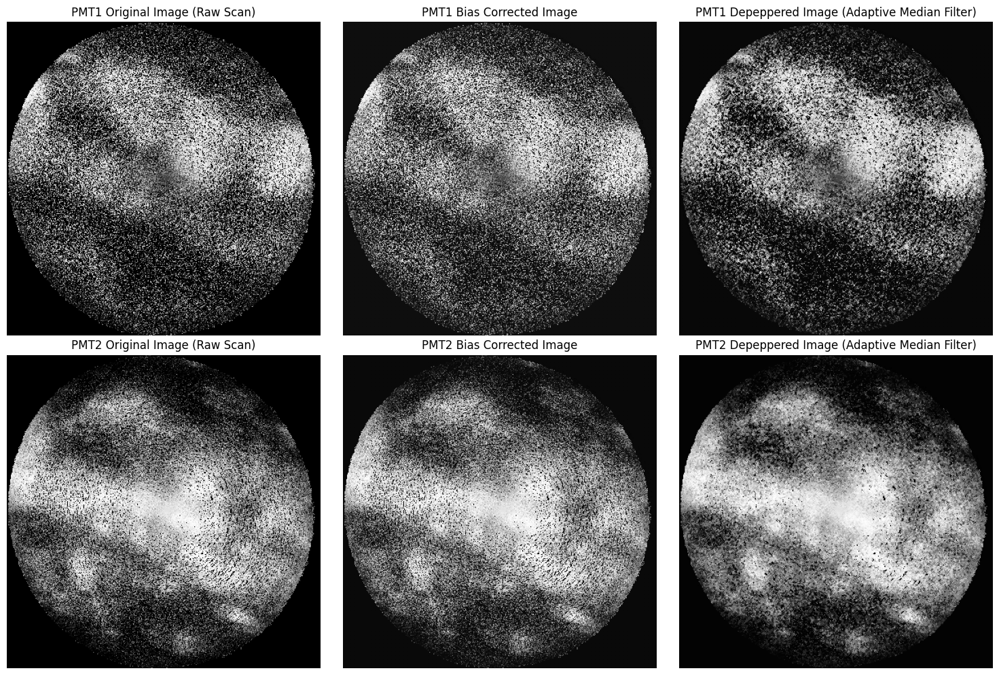

In [121]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Paths
raw_scans = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/float32_endoscopic_scans/ROI_1'
bias_maps_folder = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/bias_maps'

# Load the bias maps
bias_map_pmt1 = np.array(Image.open(os.path.join(bias_maps_folder, 'bias_map_PMT1.tiff'))).astype(np.float32)
bias_map_pmt2 = np.array(Image.open(os.path.join(bias_maps_folder, 'bias_map_PMT2.tiff'))).astype(np.float32)

# Function to load and process each scan (for both PMT1 and PMT2)
def process_scan(channel, bias_map):
    # Load raw image for the given channel
    raw_scan_path = os.path.join(raw_scans, f'Image-20250326-231205-592/{channel}.tiff')
    img = np.array(Image.open(raw_scan_path)).astype(np.float32)
    
    # Normalize the image (Min-Max normalization)
    img_normalized = (img - np.min(img)) / (np.max(img) - np.min(img))
    
    # Bias Correction: Subtract the raw image by the bias map
    corrected_img = img_normalized - bias_map

    # Apply Adaptive Median Filter after bias correction
    denoised_img = adaptive_median_filter(corrected_img)
    
    return img_normalized, corrected_img, denoised_img

# Adaptive Median Filter
def adaptive_median_filter(img, max_size=7):
    output = img.copy()
    h, w = img.shape
    for i in range(h):
        for j in range(w):
            window_size = 3
            while window_size <= max_size:
                half = window_size // 2
                xmin, xmax = max(0, i - half), min(h, i + half + 1)
                ymin, ymax = max(0, j - half), min(w, j + half + 1)
                window = img[xmin:xmax, ymin:ymax]
                z_min, z_max, z_med = np.min(window), np.max(window), np.median(window)
                z_xy = img[i, j]
                if z_min < z_med < z_max:
                    if z_min < z_xy < z_max:
                        output[i, j] = z_xy
                    else:
                        output[i, j] = z_med
                    break
                else:
                    window_size += 2
            else:
                output[i, j] = z_med
    return output

# Process both PMT1 and PMT2 channels
img_pmt1, corrected_img_pmt1, denoised_img_pmt1 = process_scan('PMT1', bias_map_pmt1)
img_pmt2, corrected_img_pmt2, denoised_img_pmt2 = process_scan('PMT2', bias_map_pmt2)

# Plot the original, corrected, and denoised images for both channels
plt.figure(figsize=(15, 10))

# PMT1 Images
plt.subplot(2, 3, 1)
plt.imshow(img_pmt1, cmap='gray')
plt.title("PMT1 Original Image (Raw Scan)")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(corrected_img_pmt1, cmap='gray')
plt.title("PMT1 Bias Corrected Image")
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(denoised_img_pmt1, cmap='gray')
plt.title("PMT1 Depeppered Image (Adaptive Median Filter)")
plt.axis('off')

# PMT2 Images
plt.subplot(2, 3, 4)
plt.imshow(img_pmt2, cmap='gray')
plt.title("PMT2 Original Image (Raw Scan)")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(corrected_img_pmt2, cmap='gray')
plt.title("PMT2 Bias Corrected Image")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(denoised_img_pmt2, cmap='gray')
plt.title("PMT2 Depeppered Image (Adaptive Median Filter)")
plt.axis('off')

plt.tight_layout()
plt.show()


After Bias Map + Pepper Filter, the contrast is improved and image is smoother without any apparent loss of artifacts but it is still considerably noisy.

Step#6: Model the Noise from the Darkframes using Residual Learning via U-Net.

In [116]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from glob import glob
import cv2

# PARAMETERS
BACKGROUND_PATH = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/structured_darkframes_endoscopic_scans'
BATCH_SIZE = 8
EPOCHS = 30
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# -----------------
# 1. Dataset (FULL images)
# -----------------
class BackgroundDataset(Dataset):
    def __init__(self, channel='PMT1'):
        self.images = []
        folders = sorted(glob(os.path.join(BACKGROUND_PATH, '*')))
        for folder in folders:
            img_files = sorted(glob(os.path.join(folder, f"*{channel}.tiff")))
            for img_file in img_files:
                img = cv2.imread(img_file, cv2.IMREAD_UNCHANGED).astype(np.float32)
                img = img / np.max(img)
                img = cv2.resize(img, (384, 384))  # ✅ resize here
                if img is not None and img.shape[0] > 0 and img.shape[1] > 0:
                    self.images.append(img)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        img = torch.from_numpy(img).unsqueeze(0)  # (1, H, W)
        return img.float()

# -----------------
# 2. Model (U-Net)
# -----------------
class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()
        self.enc1 = self.conv_block(1, 32)
        self.enc2 = self.conv_block(32, 64)
        self.enc3 = self.conv_block(64, 128)

        self.pool = nn.MaxPool2d(2)

        self.dec3 = self.conv_block(128, 128)
        self.up2 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec2 = self.conv_block(128, 64)
        self.up1 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)
        self.dec1 = self.conv_block(64, 32)

        self.final = nn.Conv2d(32, 1, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))

        d3 = self.dec3(e3)
        d2 = self.up2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)

        d1 = self.up1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)

        out = self.final(d1)
        return out

# -----------------
# 3. Training Function
# -----------------
def train_noise_model(channel='PMT1'):
    dataset = BackgroundDataset(channel)
    dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)

    model = UNet().to(DEVICE)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    criterion = nn.MSELoss()

    model.train()
    for epoch in range(EPOCHS):
        running_loss = 0.0
        for batch in dataloader:
            batch = batch.to(DEVICE)
            optimizer.zero_grad()

            preds = model(batch)
            loss = criterion(preds, torch.zeros_like(preds))  # Target is 0
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

        print(f"Epoch [{epoch+1}/{EPOCHS}] - Loss: {running_loss / len(dataloader):.6f}")

    return model

# -----------------
# 4. Denoising Function
# -----------------
def denoise_tissue_scan(model, tissue_img_path):
    model.eval()

    noisy_img = cv2.imread(tissue_img_path, cv2.IMREAD_UNCHANGED).astype(np.float32)
    noisy_img = noisy_img / np.max(noisy_img)
    noisy_img = cv2.resize(noisy_img, (384, 384))  # ✅ resize here
    input_tensor = torch.from_numpy(noisy_img).unsqueeze(0).unsqueeze(0).float().to(DEVICE)
    h, w = noisy_img.shape

    input_tensor = torch.from_numpy(noisy_img).unsqueeze(0).unsqueeze(0).float().to(DEVICE)  # (1,1,H,W)

    with torch.no_grad():
        predicted_noise = model(input_tensor)[0, 0].cpu().numpy()

    denoised_img = noisy_img - predicted_noise
    denoised_img = np.clip(denoised_img, 0, 1).astype(np.float32)

    return denoised_img

# -----------------
# 5. Main
# -----------------
if __name__ == "__main__":
    # Train model on PMT1
    model_pmt1 = train_noise_model(channel='PMT1')

    # Denoise a real tissue scan
    tissue_img_path = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/normalized_float32_endoscopic_scans/ROI_1/Image-20250326-231205-592/PMT1.tiff'
    denoised_img = denoise_tissue_scan(model_pmt1, tissue_img_path)

    # Save result
    denoised_uint16 = (denoised_img * 65535).astype(np.uint16)
    cv2.imwrite('denoised_tissue_scan_PMT1.tiff', denoised_uint16)


Epoch [1/30] - Loss: 0.000203
Epoch [2/30] - Loss: 0.000007
Epoch [3/30] - Loss: 0.000002
Epoch [4/30] - Loss: 0.000001
Epoch [5/30] - Loss: 0.000000
Epoch [6/30] - Loss: 0.000000
Epoch [7/30] - Loss: 0.000000
Epoch [8/30] - Loss: 0.000000
Epoch [9/30] - Loss: 0.000000
Epoch [10/30] - Loss: 0.000000
Epoch [11/30] - Loss: 0.000000
Epoch [12/30] - Loss: 0.000000
Epoch [13/30] - Loss: 0.000000
Epoch [14/30] - Loss: 0.000000
Epoch [15/30] - Loss: 0.000000
Epoch [16/30] - Loss: 0.000000
Epoch [17/30] - Loss: 0.000000
Epoch [18/30] - Loss: 0.000000
Epoch [19/30] - Loss: 0.000000
Epoch [20/30] - Loss: 0.000000
Epoch [21/30] - Loss: 0.000000
Epoch [22/30] - Loss: 0.000000
Epoch [23/30] - Loss: 0.000000
Epoch [24/30] - Loss: 0.000000
Epoch [25/30] - Loss: 0.000000
Epoch [26/30] - Loss: 0.000000
Epoch [27/30] - Loss: 0.000000
Epoch [28/30] - Loss: 0.000000
Epoch [29/30] - Loss: 0.000000
Epoch [30/30] - Loss: 0.000000


Denoise a depeppered image using the ResUNet

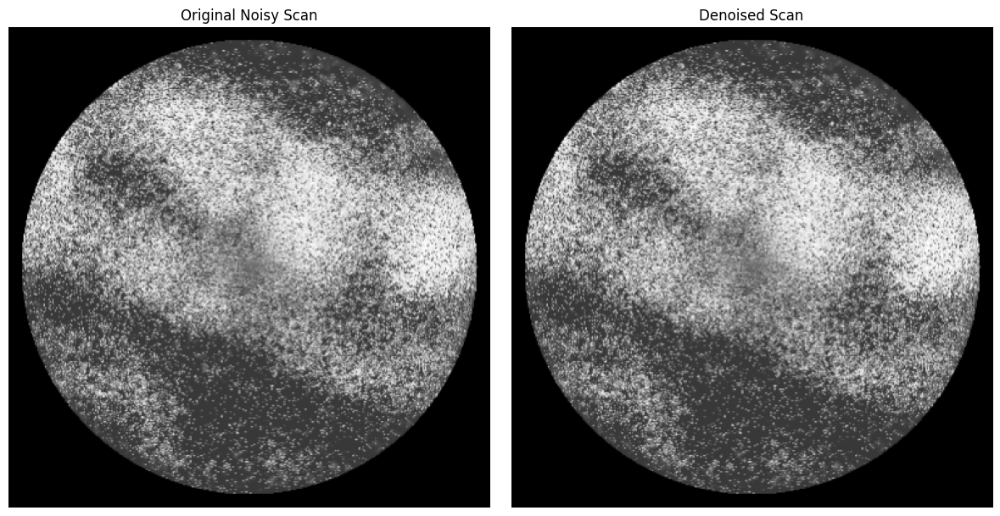

In [ ]:
import matplotlib.pyplot as plt

# -----------------
# 5. Main
# -----------------
if __name__ == "__main__":

    # Load and Denoise a real tissue scan
    tissue_img_path = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/depeppered_endoscopic_scans/ROI_1/Image-20250326-231205-592/PMT1.tiff'

    # Load original noisy image
    noisy_img = cv2.imread(tissue_img_path, cv2.IMREAD_UNCHANGED).astype(np.float32)
    noisy_img = noisy_img / np.max(noisy_img)  # Normalize
    noisy_img = cv2.resize(noisy_img, (384, 384))  # Resize to match model input size

    # Denoise
    denoised_img = denoise_tissue_scan(model_pmt1, tissue_img_path)

    # Display both images
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(noisy_img, cmap='gray')
    axes[0].set_title('Original Noisy Scan')
    axes[0].axis('off')

    axes[1].imshow(denoised_img, cmap='gray')
    axes[1].set_title('Denoised Scan')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
Wavelet Denoising 

In [72]:
%pip install PyWavelets


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 2.7 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


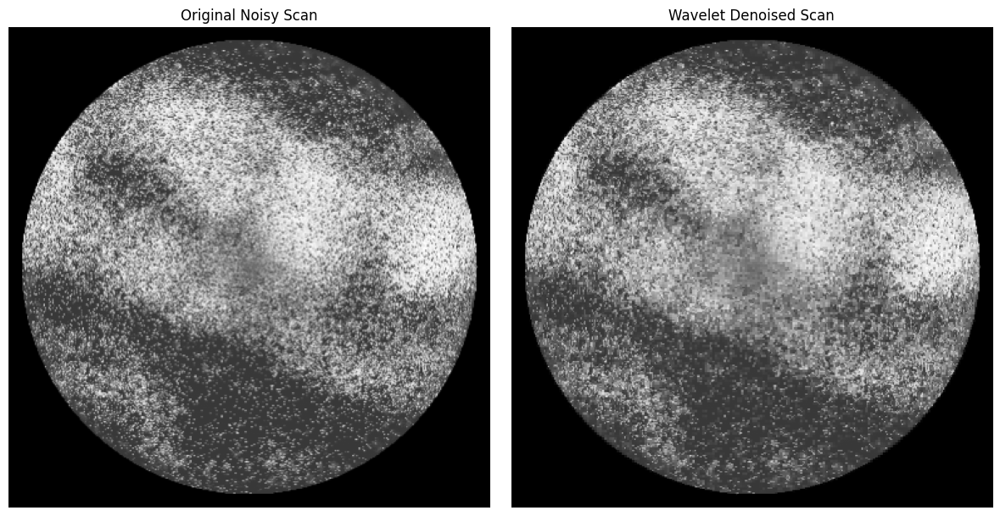

In [122]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pywt
import pywt.data

def wavelet_denoise(img, wavelet='db1', level=1):
    """Wavelet denoise a 2D grayscale image."""

    # Decompose to wavelet coefficients
    coeffs = pywt.wavedec2(img, wavelet=wavelet, level=level)

    # Estimate a universal threshold
    sigma = np.median(np.abs(coeffs[-1][-1])) / 0.6745
    uthresh = sigma * np.sqrt(2 * np.log(img.size))

    # Apply hard thresholding
    coeffs_thresh = list()
    coeffs_thresh.append(coeffs[0])  # Approximation coefficients (keep unchanged)
    
    for detail_level in coeffs[1:]:
        cH, cV, cD = detail_level
        cH = pywt.threshold(cH, uthresh, mode='hard')
        cV = pywt.threshold(cV, uthresh, mode='hard')
        cD = pywt.threshold(cD, uthresh, mode='hard')
        coeffs_thresh.append((cH, cV, cD))

    # Reconstruct image
    denoised_img = pywt.waverec2(coeffs_thresh, wavelet)
    denoised_img = np.clip(denoised_img, 0, 1).astype(np.float32)

    return denoised_img

# --------- Main Program ------------

# Load a noisy tissue scan
tissue_img_path = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/depeppered_endoscopic_scans/ROI_1/Image-20250326-231205-592/PMT1.tiff'

noisy_img = cv2.imread(tissue_img_path, cv2.IMREAD_UNCHANGED).astype(np.float32)
noisy_img = noisy_img / np.max(noisy_img)  # Normalize to [0,1]

# Resize to 384x384 if needed
noisy_img = cv2.resize(noisy_img, (384, 384))

# Denoise using wavelet denoising
denoised_img = wavelet_denoise(noisy_img, wavelet='db1', level=1)

# Display both
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(noisy_img, cmap='gray', vmin=0, vmax=1)
axes[0].set_title('Original Noisy Scan')
axes[0].axis('off')

axes[1].imshow(denoised_img, cmap='gray', vmin=0, vmax=1)
axes[1].set_title('Wavelet Denoised Scan')
axes[1].axis('off')

plt.tight_layout()
plt.show()


See how binarising protects the artifacts.

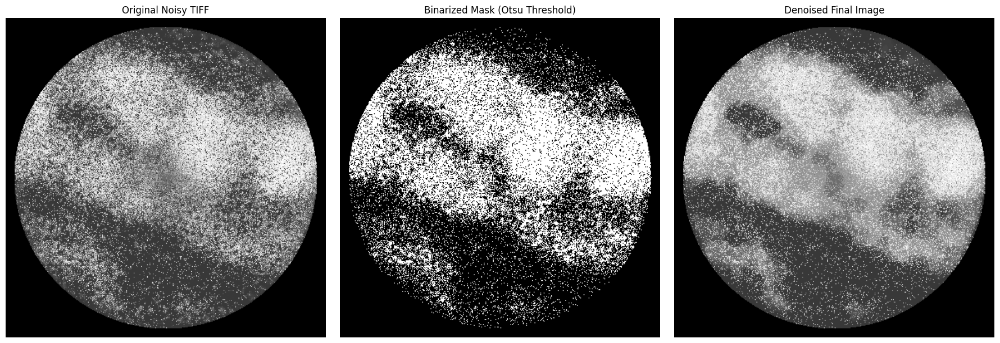

In [137]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
from scipy.ndimage import median_filter

# Load the noisy scan (TIFF, float32)
noisy_img = cv2.imread('/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/depeppered_endoscopic_scans/ROI_1/Image-20250326-231205-592/PMT1.tiff', cv2.IMREAD_UNCHANGED).astype(np.float32)

# Normalize to [0,1] if needed (optional if your TIFF isn't already scaled)
if noisy_img.max() > 1.0:
    noisy_img = noisy_img / np.max(noisy_img)

# Step 1: Binarize using Otsu threshold
thresh_val = threshold_otsu(noisy_img)
binary_img = (noisy_img > thresh_val).astype(np.float32)

# Step 2: Smooth the noisy scan
smoothed_img = median_filter(noisy_img, size=15)  # 3x3 median filter

# Step 3: Blend: keep strong signal from binarized regions, smooth background
final_img = np.where(binary_img == 1, noisy_img, smoothed_img)

# Step 4: Display all results
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(noisy_img, cmap='gray', vmin=0, vmax=1)
axes[0].set_title('Original Noisy TIFF')
axes[0].axis('off')

axes[1].imshow(binary_img, cmap='gray')
axes[1].set_title('Binarized Mask (Otsu Threshold)')
axes[1].axis('off')

axes[2].imshow(final_img, cmap='gray', vmin=0, vmax=1)
axes[2].set_title('Denoised Final Image')
axes[2].axis('off')

plt.tight_layout()
plt.show()


Apply on all images & save

In [175]:
import os
import numpy as np
import cv2
from skimage.filters import threshold_otsu
from scipy.ndimage import median_filter
from PIL import Image

# =============== Load Bias Maps ===============
bias_maps_folder = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/bias_maps'
bias_map_pmt1 = np.array(Image.open(os.path.join(bias_maps_folder, 'bias_map_PMT1.tiff'))).astype(np.float32)
bias_map_pmt2 = np.array(Image.open(os.path.join(bias_maps_folder, 'bias_map_PMT2.tiff'))).astype(np.float32)

# =============== Define Processing Function ===============
def process_image(noisy_img, bias_map):
    # Normalize raw noisy image
    if noisy_img.max() > 1.0:
        noisy_img = noisy_img / noisy_img.max()

    # Step 1: Bias Correction
    corrected_img = noisy_img - bias_map

    # Clip corrected image to [0,1] range after bias subtraction
    corrected_img = np.clip(corrected_img, 0.0, 1.0)

    # Step 2: Binarization (Otsu threshold on corrected image)
    thresh_val = threshold_otsu(corrected_img)
    binary_img = (corrected_img > thresh_val).astype(np.float32)

    # Step 3: Median smoothing
    smoothed_img = median_filter(corrected_img, size=3)

    # Step 4: Blending
    final_img = np.where(binary_img == 1, corrected_img, smoothed_img)

    return final_img

# =============== Main Batch Processing ===============
input_root = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/depeppered_endoscopic_scans'
output_root = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/ppns_endoscopic_scans'

# Loop through ROI folders
for roi_name in os.listdir(input_root):
    roi_input_path = os.path.join(input_root, roi_name)
    roi_output_path = os.path.join(output_root, roi_name)

    if not os.path.isdir(roi_input_path):
        continue

    os.makedirs(roi_output_path, exist_ok=True)

    # Loop through each subfolder
    for subfolder_name in os.listdir(roi_input_path):
        subfolder_input_path = os.path.join(roi_input_path, subfolder_name)
        subfolder_output_path = os.path.join(roi_output_path, subfolder_name)

        if not os.path.isdir(subfolder_input_path):
            continue

        os.makedirs(subfolder_output_path, exist_ok=True)

        # Process PMT1.tiff and PMT2.tiff
        for channel in ['PMT1.tiff', 'PMT2.tiff']:
            input_img_path = os.path.join(subfolder_input_path, channel)
            output_img_path = os.path.join(subfolder_output_path, channel)

            if os.path.isfile(input_img_path):
                # Load noisy image
                noisy_img = cv2.imread(input_img_path, cv2.IMREAD_UNCHANGED).astype(np.float32)

                # Select correct bias map
                if channel == 'PMT1.tiff':
                    bias_map = bias_map_pmt1
                else:
                    bias_map = bias_map_pmt2

                # Process
                final_img = process_image(noisy_img, bias_map)

                # Save final image
                final_img_scaled = np.clip(final_img * 65535.0, 0, 65535).astype(np.uint16)
                cv2.imwrite(output_img_path, final_img_scaled)

print("✅ Processing complete! All bias-corrected + denoised images saved to:", output_root)


✅ Processing complete! All bias-corrected + denoised images saved to: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/ppns_endoscopic_scans


In [176]:
# Do with wavelet denoising

import os
import numpy as np
import cv2
from skimage.filters import threshold_otsu
from scipy.ndimage import median_filter
from skimage.restoration import denoise_wavelet
from PIL import Image

# =============== Load Bias Maps ===============
bias_maps_folder = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/bias_maps'
bias_map_pmt1 = np.array(Image.open(os.path.join(bias_maps_folder, 'bias_map_PMT1.tiff'))).astype(np.float32)
bias_map_pmt2 = np.array(Image.open(os.path.join(bias_maps_folder, 'bias_map_PMT2.tiff'))).astype(np.float32)

# =============== Define Processing Function ===============
def process_image(noisy_img, bias_map):
    # Normalize raw noisy image
    if noisy_img.max() > 1.0:
        noisy_img = noisy_img / noisy_img.max()

    # Step 1: Bias Correction
    corrected_img = noisy_img - bias_map
    corrected_img = np.clip(corrected_img, 0.0, 1.0)

    # Step 2: Binarization
    thresh_val = threshold_otsu(corrected_img)
    binary_img = (corrected_img > thresh_val).astype(np.float32)

    # Step 3: Median smoothing
    smoothed_img = median_filter(corrected_img, size=15)

    # Step 4: Blending
    blended_img = np.where(binary_img == 1, corrected_img, smoothed_img)

    # Step 5: Wavelet Denoising (NEW)
    denoised_img = denoise_wavelet(blended_img,
                                   wavelet='sym4',
                                   method='BayesShrink',
                                   mode='soft',
                                   rescale_sigma=True)

    return denoised_img

# =============== Main Batch Processing ===============
input_root = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/depeppered_endoscopic_scans'
output_root = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/wdppns_endoscopic_scans'

for roi_name in os.listdir(input_root):
    roi_input_path = os.path.join(input_root, roi_name)
    roi_output_path = os.path.join(output_root, roi_name)

    if not os.path.isdir(roi_input_path):
        continue

    os.makedirs(roi_output_path, exist_ok=True)

    for subfolder_name in os.listdir(roi_input_path):
        subfolder_input_path = os.path.join(roi_input_path, subfolder_name)
        subfolder_output_path = os.path.join(roi_output_path, subfolder_name)

        if not os.path.isdir(subfolder_input_path):
            continue

        os.makedirs(subfolder_output_path, exist_ok=True)

        # Process PMT1 and PMT2
        for channel in ['PMT1.tiff', 'PMT2.tiff']:
            input_img_path = os.path.join(subfolder_input_path, channel)
            output_img_path = os.path.join(subfolder_output_path, channel)

            if os.path.isfile(input_img_path):
                noisy_img = cv2.imread(input_img_path, cv2.IMREAD_UNCHANGED).astype(np.float32)

                # Select appropriate bias map
                if channel == 'PMT1.tiff':
                    bias_map = bias_map_pmt1
                else:
                    bias_map = bias_map_pmt2

                # Full processing pipeline
                final_img = process_image(noisy_img, bias_map)

                # Scale and save
                final_img_scaled = np.clip(final_img * 65535.0, 0, 65535).astype(np.uint16)
                cv2.imwrite(output_img_path, final_img_scaled)

print("✅ Processing complete! Bias-corrected, blended, wavelet-denoised images saved to:", output_root)


✅ Processing complete! Bias-corrected, blended, wavelet-denoised images saved to: /Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/wdppns_endoscopic_scans


Wavelet denoising after binarising.

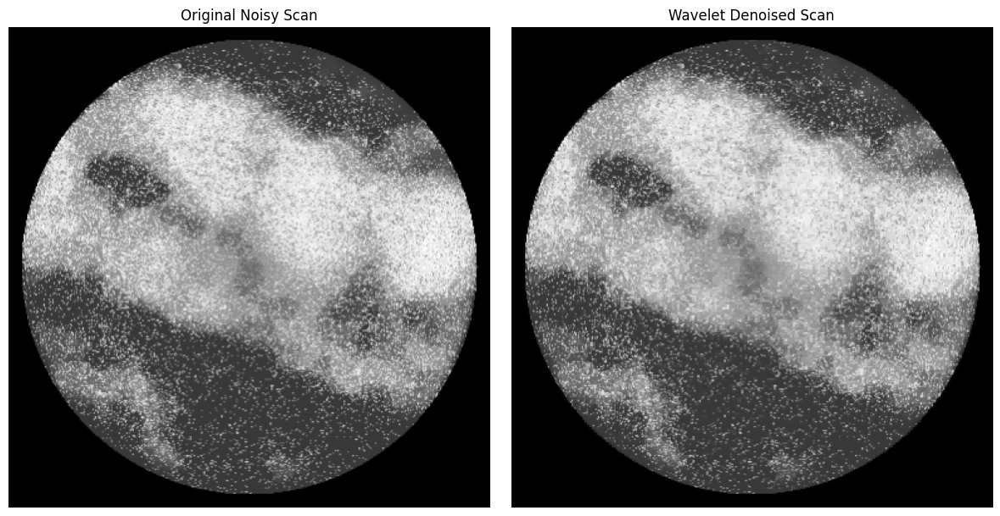

In [139]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pywt
import pywt.data

def wavelet_denoise(img, wavelet='db1', level=1):
    """Wavelet denoise a 2D grayscale image."""

    # Decompose to wavelet coefficients
    coeffs = pywt.wavedec2(img, wavelet=wavelet, level=level)

    # Estimate a universal threshold
    sigma = np.median(np.abs(coeffs[-1][-1])) / 0.6745
    uthresh = sigma * np.sqrt(2 * np.log(img.size))

    # Apply hard thresholding
    coeffs_thresh = list()
    coeffs_thresh.append(coeffs[0])  # Approximation coefficients (keep unchanged)
    
    for detail_level in coeffs[1:]:
        cH, cV, cD = detail_level
        cH = pywt.threshold(cH, uthresh, mode='hard')
        cV = pywt.threshold(cV, uthresh, mode='hard')
        cD = pywt.threshold(cD, uthresh, mode='hard')
        coeffs_thresh.append((cH, cV, cD))

    # Reconstruct image
    denoised_img = pywt.waverec2(coeffs_thresh, wavelet)
    denoised_img = np.clip(denoised_img, 0, 1).astype(np.float32)

    return denoised_img

# --------- Main Program ------------


noisy_img = final_img
noisy_img = noisy_img / np.max(noisy_img)  # Normalize to [0,1]

# Resize to 384x384 if needed
noisy_img = cv2.resize(noisy_img, (384, 384))

# Denoise using wavelet denoising
denoised_img = wavelet_denoise(noisy_img, wavelet='db1', level=1)

# Display both
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(noisy_img, cmap='gray', vmin=0, vmax=1)
axes[0].set_title('Original Noisy Scan')
axes[0].axis('off')

axes[1].imshow(denoised_img, cmap='gray', vmin=0, vmax=1)
axes[1].set_title('Wavelet Denoised Scan')
axes[1].axis('off')

plt.tight_layout()
plt.show()


Convolutional Autoencoder to Denoise Unsupervised

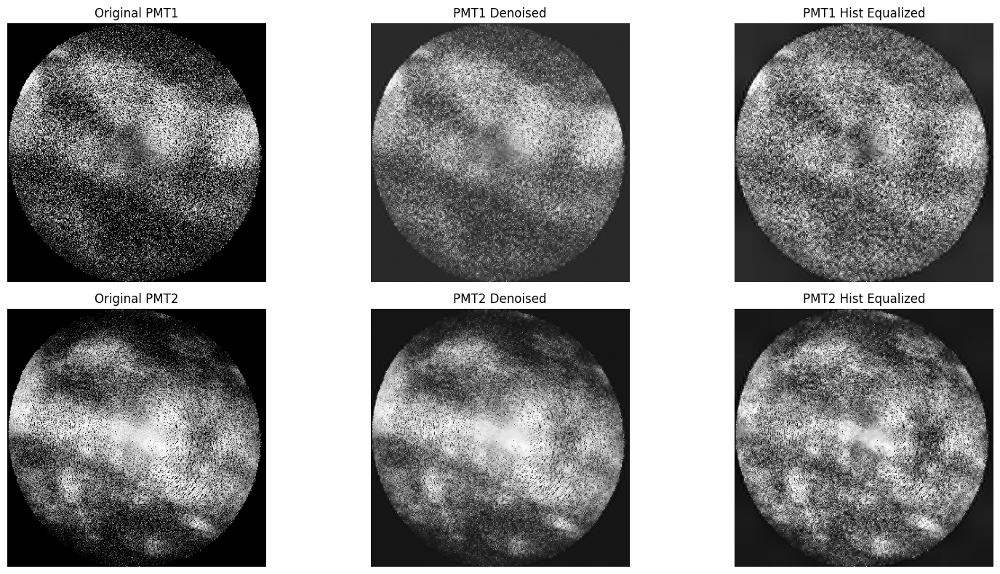

In [166]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import binary_closing, binary_fill_holes
from skimage.morphology import disk
from skimage.restoration import denoise_wavelet, inpaint
from skimage import exposure
from skimage.io import imread

# ------------------------
# Load Images
# ------------------------
final_pm1_path = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/float32_endoscopic_scans/ROI_1/Image-20250326-231205-592/PMT1.tiff'
final_pm2_path = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/float32_endoscopic_scans/ROI_1/Image-20250326-231205-592/PMT2.tiff'  # Make sure it's PMT2.tiff!

final_pm1 = imread(final_pm1_path).astype(np.float32)
final_pm2 = imread(final_pm2_path).astype(np.float32)

# Ensure images are normalized [0,1]
final_pm1 = final_pm1 / np.max(final_pm1)
final_pm2 = final_pm2 / np.max(final_pm2)

# ------------------------
# Apply mask and gap fill
# ------------------------
maskROI = (final_pm1 > 0) | (final_pm2 > 0)

# Morphological closing
selem = disk(3)
maskROI_closed = binary_closing(maskROI, structure=selem)

# Fill holes
maskROI_filled = binary_fill_holes(maskROI_closed)

# Find gaps
maskGap = maskROI_filled & (final_pm1 == 0) & (final_pm2 == 0)

# Inpainting
I1_inpainted = inpaint.inpaint_biharmonic(final_pm1, maskGap, channel_axis=None)
I2_inpainted = inpaint.inpaint_biharmonic(final_pm2, maskGap, channel_axis=None)

# ------------------------
# Wavelet Denoising
# ------------------------
I1_denoised = denoise_wavelet(I1_inpainted,
                              wavelet='sym4',
                              method='BayesShrink',
                              mode='soft',
                              rescale_sigma=True)

I2_denoised = denoise_wavelet(I2_inpainted,
                              wavelet='sym4',
                              method='BayesShrink',
                              mode='soft',
                              rescale_sigma=True)

# Clip again [0,1] just in case
I1_denoised = np.clip(I1_denoised, 0, 1)
I2_denoised = np.clip(I2_denoised, 0, 1)

# ------------------------
# Adaptive Histogram Equalization
# ------------------------
I1_eq = exposure.equalize_adapthist(I1_denoised, clip_limit=0.01)
I2_eq = exposure.equalize_adapthist(I2_denoised, clip_limit=0.01)

# ------------------------
# Plotting the Results
# ------------------------
plt.figure(figsize=(16, 8))

plt.subplot(2, 3, 1)
plt.imshow(final_pm1, cmap='gray')
plt.title('Original PMT1')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(I1_denoised, cmap='gray')
plt.title('PMT1 Denoised')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(I1_eq, cmap='gray')
plt.title('PMT1 Hist Equalized')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(final_pm2, cmap='gray')
plt.title('Original PMT2')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(I2_denoised, cmap='gray')
plt.title('PMT2 Denoised')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(I2_eq, cmap='gray')
plt.title('PMT2 Hist Equalized')
plt.axis('off')

plt.tight_layout()
plt.show()


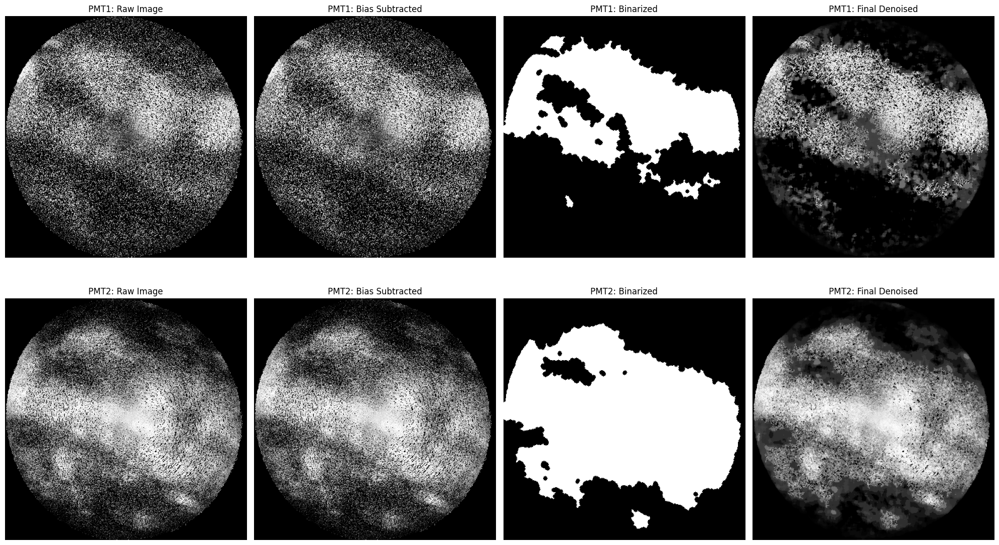

In [172]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.filters import threshold_otsu
from skimage.morphology import remove_small_objects, binary_closing, disk
from scipy.ndimage import median_filter

# Paths
raw_scans = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/float32_endoscopic_scans/ROI_1'
bias_maps_folder = '/Users/alliyaparvez/Documents/canc_img_denois_s25/dataset/bias_maps'

# Load the bias maps
bias_map_pmt1 = np.array(Image.open(os.path.join(bias_maps_folder, 'bias_map_PMT1.tiff'))).astype(np.float32)
bias_map_pmt2 = np.array(Image.open(os.path.join(bias_maps_folder, 'bias_map_PMT2.tiff'))).astype(np.float32)

# Adaptive Median Filter
def adaptive_median_filter(img, max_size=7):
    output = img.copy()
    h, w = img.shape
    for i in range(h):
        for j in range(w):
            window_size = 3
            while window_size <= max_size:
                half = window_size // 2
                xmin, xmax = max(0, i - half), min(h, i + half + 1)
                ymin, ymax = max(0, j - half), min(w, j + half + 1)
                window = img[xmin:xmax, ymin:ymax]
                z_min, z_max, z_med = np.min(window), np.max(window), np.median(window)
                z_xy = img[i, j]
                if z_min < z_med < z_max:
                    if z_min < z_xy < z_max:
                        output[i, j] = z_xy
                    else:
                        output[i, j] = z_med
                    break
                else:
                    window_size += 2
            else:
                output[i, j] = z_med
    return output

# Process each scan
def process_scan(channel, bias_map):
    # Load raw image
    raw_scan_path = os.path.join(raw_scans, f'Image-20250326-231205-592/{channel}.tiff')
    img = np.array(Image.open(raw_scan_path)).astype(np.float32)

    # Normalize
    img_normalized = (img - np.min(img)) / (np.max(img) - np.min(img))

    # Step 1: Bias correction
    corrected_img = img_normalized - bias_map

    # Step 2: Adaptive Median Filtering (depepper)
    depeppered_img = adaptive_median_filter(corrected_img)


    # Step 3: Binarization
    thresh_val = threshold_otsu(depeppered_img)
    binary_mask = (depeppered_img > thresh_val)

    # Step 4: Clean up binary mask
    binary_mask_cleaned = remove_small_objects(binary_mask, min_size=100)  # Remove small noise blobs
    binary_mask_cleaned = binary_closing(binary_mask_cleaned, footprint=disk(3))  # Close small gaps


    # Step 5: Smooth background with regular median filtering
    smoothed_background = median_filter(depeppered_img, size=7)

    # Step 6: Blend: preserve strong signals, smooth background elsewhere
    final_img = np.where(binary_mask_cleaned, depeppered_img, smoothed_background)

    return img_normalized, corrected_img, binary_mask_cleaned.astype(np.float32), final_img

# Process both PMT1 and PMT2
img_pmt1, corrected_pmt1, binary_pmt1, final_pm1 = process_scan('PMT1', bias_map_pmt1)
img_pmt2, corrected_pmt2, binary_pmt2, final_pm2 = process_scan('PMT2', bias_map_pmt2)

# ------------------
# Plotting
# ------------------
plt.figure(figsize=(20, 12))

# PMT1
plt.subplot(2, 4, 1)
plt.imshow(img_pmt1, cmap='gray', vmin=0, vmax=1)
plt.title('PMT1: Raw Image')
plt.axis('off')

plt.subplot(2, 4, 2)
plt.imshow(corrected_pmt1, cmap='gray', vmin=0, vmax=1)
plt.title('PMT1: Bias Subtracted')
plt.axis('off')

plt.subplot(2, 4, 3)
plt.imshow(binary_pmt1, cmap='gray')
plt.title('PMT1: Binarized')
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(final_pm1, cmap='gray', vmin=0, vmax=1)
plt.title('PMT1: Final Denoised')
plt.axis('off')

# PMT2
plt.subplot(2, 4, 5)
plt.imshow(img_pmt2, cmap='gray', vmin=0, vmax=1)
plt.title('PMT2: Raw Image')
plt.axis('off')

plt.subplot(2, 4, 6)
plt.imshow(corrected_pmt2, cmap='gray', vmin=0, vmax=1)
plt.title('PMT2: Bias Subtracted')
plt.axis('off')

plt.subplot(2, 4, 7)
plt.imshow(binary_pmt2, cmap='gray')
plt.title('PMT2: Binarized')
plt.axis('off')

plt.subplot(2, 4, 8)
plt.imshow(final_pm2, cmap='gray', vmin=0, vmax=1)
plt.title('PMT2: Final Denoised')
plt.axis('off')

plt.tight_layout()
plt.show()